<a href="https://colab.research.google.com/github/rjc89/Data_science_portfolio/blob/master/NLP_drug_discovery.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Import some standard data science libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%config InlineBackend.figure_format = 'retina'

# libraries for connecting to the API and parsing JSON files
import requests
import json

# Part A - Working

Using the data from the OpenFDA API (documentation at https://open.fda.gov/apis/drug/label/) to determine the average number of ingredients (spl_product_data_elements) contained in AstraZeneca medicines per year.

- Choose a method to gather the data
- Transform the data as you see fit
- Visualize and explore the results

The output should look similar to:

In [0]:
# year   drug_names     avg_number_of_ingredients
# 2018   drugA,drugB    21
# ... 

OpenFDA API notes:

The API returns individual results as JSON by default. The JSON object has two sections:

- meta: Metadata about the query, including a disclaimer, link to data license, last-updated date, and total matching records, if applicable.

- results: An array of matching results, dependent on which endpoint was queried.


In [0]:
# use the requests library to pull data from the openFDA database, setting up the query according to API instructions:
# retreiving the AstraZeneca drugs, with spl_product_data_elements information, with the date they entered the database
# and retrieving the maximum number of results allowed, so that we get the comprehensive list of AstraZeneca drugs

URL = 'https://api.fda.gov/drug//label.json?search=openfda.manufacturer_name:"AstraZeneca Pharmaceuticals LP"+AND+_exists_:spl_product_data_elements+AND+effective_time:[20090601+TO+20190812]&limit=99'

data = requests.get(URL).json()

# for result in data.get('results', []):
  
#   print (result)

In [0]:
# The JSON data structure from the URL gets read in as a Python dictionary

print(type(data))

<class 'dict'>


In [0]:
# inspecting the dictionary

data

{'meta': {'disclaimer': 'Do not rely on openFDA to make decisions regarding medical care. While we make every effort to ensure that data is accurate, you should assume all results are unvalidated. We may limit or otherwise restrict your access to the API in line with our Terms of Service.',
  'last_updated': '2019-08-10',
  'license': 'https://open.fda.gov/license/',
  'results': {'limit': 99, 'skip': 0, 'total': 43},
  'terms': 'https://open.fda.gov/terms/'},
 'results': [{'adverse_reactions': ['6. ADVERSE REACTIONS Because clinical trials are conducted under widely varying conditions, adverse reaction rates observed in the clinical trials of a drug cannot be directly compared to rates in the clinical trials of another drug and may not reflect the rates observed in practice. Adverse reactions that occurred in more than 10% of patients receiving CASODEX plus an LHRH-A were: hot flashes, pain (including general, back, pelvic and abdominal), asthenia, constipation, infection, nausea, per

In [0]:
# Two main keys or columns in the dictionary, 'meta' (meta data about the query) and the 'results'

len(data)

2

In [0]:
# 43 results (drugs) in the query, seems to roughly check out with the list posted here: 
# https://www.astrazeneca-us.com/medicines/astrazeneca-medications.html

data['meta']

{'disclaimer': 'Do not rely on openFDA to make decisions regarding medical care. While we make every effort to ensure that data is accurate, you should assume all results are unvalidated. We may limit or otherwise restrict your access to the API in line with our Terms of Service.',
 'last_updated': '2019-08-10',
 'license': 'https://open.fda.gov/license/',
 'results': {'limit': 99, 'skip': 0, 'total': 43},
 'terms': 'https://open.fda.gov/terms/'}

In [0]:
# loads of data not possible to easily digest or manipulate in this dictionary format

data['results']

[{'adverse_reactions': ['6. ADVERSE REACTIONS Because clinical trials are conducted under widely varying conditions, adverse reaction rates observed in the clinical trials of a drug cannot be directly compared to rates in the clinical trials of another drug and may not reflect the rates observed in practice. Adverse reactions that occurred in more than 10% of patients receiving CASODEX plus an LHRH-A were: hot flashes, pain (including general, back, pelvic and abdominal), asthenia, constipation, infection, nausea, peripheral edema, dyspnea, diarrhea, hematuria, nocturia, and anemia. (6.1) To report SUSPECTED ADVERSE REACTIONS, contact AstraZeneca Pharmaceuticals LP at 1-800-236-9933 or FDA at 1-800-FDA-1088 or www.fda.gov/medwatch 6.1. Clinical Trials Experience In patients with advanced prostate cancer treated with CASODEX in combination with an LHRH analog, the most frequent adverse reaction was hot flashes (53%). In the multi-center, double-blind, controlled clinical trial comparing

In [0]:
# move the 'results' into a pandas DataFrame to make it easier to inspect and manipulate

df_results = pd.DataFrame.from_dict(data['results'], orient='columns')

In [0]:
df_results

,abuse,adverse_reactions,adverse_reactions_table,animal_pharmacology_and_or_toxicology,boxed_warning,carcinogenesis_and_mutagenesis_and_impairment_of_fertility,clinical_pharmacology,clinical_pharmacology_table,clinical_studies,clinical_studies_table,contraindications,controlled_substance,description,dosage_and_administration,dosage_and_administration_table,dosage_forms_and_strengths,drug_abuse_and_dependence,drug_interactions,drug_interactions_table,effective_time,general_precautions,geriatric_use,how_supplied,how_supplied_table,id,indications_and_usage,information_for_patients,instructions_for_use,instructions_for_use_table,labor_and_delivery,laboratory_tests,mechanism_of_action,mechanism_of_action_table,microbiology,nonclinical_toxicology,nursing_mothers,openfda,overdosage,package_label_principal_display_panel,package_label_principal_display_panel_table,pediatric_use,pediatric_use_table,pharmacodynamics,pharmacodynamics_table,pharmacokinetics,pharmacokinetics_table,precautions,pregnancy,recent_major_changes,recent_major_changes_table,references,risks,set_id,spl_medguide,spl_medguide_table,spl_patient_package_insert,spl_patient_package_insert_table,spl_product_data_elements,spl_unclassified_section,storage_and_handling,storage_and_handling_table,teratogenic_effects,use_in_specific_populations,use_in_specific_populations_table,version,warnings,warnings_and_cautions,warnings_and_cautions_table
0,NaN,[6. ADVERSE REACTIONS Because clinical trials ...,"[<table ID=""_RefID0EHMAC"" width=""100%""> <capti...",NaN,NaN,"[13.1. Carcinogenesis, Mutagenesis, Impairment...",[12. CLINICAL PHARMACOLOGY 12.1. Mechanism of ...,"[<table width=""100%""> <caption>Table 3. Pharma...",[14. CLINICAL STUDIES 14.1. CASODEX 50 mg Dail...,NaN,[4. CONTRAINDICATIONS CASODEX is contraindicat...,NaN,[11. DESCRIPTION CASODEX® (bicalutamide) table...,[2. DOSAGE AND ADMINISTRATION The recommended ...,NaN,[3. DOSAGE FORMS AND STRENGTHS CASODEX® (bical...,NaN,[7. DRUG INTERACTIONS Clinical studies have no...,NaN,20171101,NaN,[8.5. Geriatric Use In two studies in patients...,"[16. HOW SUPPLIED/STORAGE AND HANDLING White, ...",NaN,dbfb2d98-13ad-4815-83d6-b0e10e184881,[1. INDICATIONS AND USAGE CASODEX 50 mg daily ...,[17. PATIENT COUNSELING INFORMATION Advise the...,NaN,NaN,NaN,NaN,[12.1. Mechanism of Action CASODEX is a non-st...,NaN,NaN,[13. NONCLINICAL TOXICOLOGY 13.1. Carcinogenes...,NaN,"{'product_ndc': ['0310-0705'], 'is_original_pa...",[10. OVERDOSAGE Long-term clinical trials have...,[PACKAGE/LABEL PRINCIPAL DISPLAY PANEL – 50 mg...,NaN,[8.4. Pediatric Use The safety and effectivene...,"[<table ID=""_RefID0EXPAE"" width=""100%""> <capti...",NaN,NaN,[12.3. Pharmacokinetics Absorption Bicalutamid...,"[<table width=""100%""> <caption>Table 3. Pharma...",NaN,[8.1. Pregnancy Risk Summary CASODEX is contra...,[Warnings and Precautions (5.2) 5/2017],NaN,NaN,NaN,03607c0d-b772-435f-c985-ecce8ea8cafd,NaN,NaN,NaN,NaN,[CASODEX Bicalutamide BICALUTAMIDE BICALUTAMID...,NaN,[16.1. Storage and Handling Store at controlle...,NaN,NaN,[8. USE IN SPECIFIC POPULATIONS •Females and M...,"[<table ID=""_RefID0EXPAE"" width=""100%""> <capti...",20,NaN,[5. WARNINGS AND PRECAUTIONS •Severe hepatic i...,NaN
1,[9.2 Abuse SEROQUEL has not been systematicall...,[6 ADVERSE REACTIONS The following adverse rea...,"[<table ID=""_RefID0EBEBI"" width=""100%""> <capti...",[13.2 Animal Toxicology and/or Pharmacology Qu...,[WARNING: INCREASED MORTALITY IN ELDERLY PATIE...,"[13.1 Carcinogenesis, Mutagenesis, Impairment ...",[12 CLINICAL PHARMACOLOGY 12.1 Mechanism of Ac...,"[<table ID=""_RefID0EGZBK"" width=""100%""> <capti...",[14 CLINICAL STUDIES 14.1 Schizophrenia Short-...,"[<table ID=""_RefID0EXJCK"" width=""100%""> <capti...",[4 CONTRAINDICATIONS Hypersensitivity to queti...,[9.1 Controlled Substance SEROQUEL is not a co...,[11 DESCRIPTION SEROQUEL® (quetiapine fumarate...,[2 DOSAGE AND ADMINISTRATION •SEROQUEL can be ...,"[<table width=""100%""> <col width=""40%""/> <col ...",[3 DOSAGE FORM

In [0]:
# some of the columns are not shown above because there are too many, just check what columns we have

df_results.columns

Index(['abuse', 'adverse_reactions', 'adverse_reactions_table',
       'animal_pharmacology_and_or_toxicology', 'boxed_warning',
       'carcinogenesis_and_mutagenesis_and_impairment_of_fertility',
       'clinical_pharmacology', 'clinical_pharmacology_table',
       'clinical_studies', 'clinical_studies_table', 'contraindications',
       'controlled_substance', 'description', 'dosage_and_administration',
       'dosage_and_administration_table', 'dosage_forms_and_strengths',
       'drug_abuse_and_dependence', 'drug_interactions',
       'drug_interactions_table', 'effective_time', 'general_precautions',
       'geriatric_use', 'how_supplied', 'how_supplied_table', 'id',
       'indications_and_usage', 'information_for_patients',
       'instructions_for_use', 'instructions_for_use_table',
       'labor_and_delivery', 'laboratory_tests', 'mechanism_of_action',
       'mechanism_of_action_table', 'microbiology', 'nonclinical_toxicology',
       'nursing_mothers', 'openfda', 'overdosag

In [0]:
# inspecting the 'spl_product_data_elements' column, that we're interested in
# the format seems to be that the Brand name comes first, followed by the chemical name of the drug,
# followed by a redundant list of component ingredients in the formulation

df_results['spl_product_data_elements']

0     [CASODEX Bicalutamide BICALUTAMIDE BICALUTAMID...
1     [SEROQUEL Quetiapine fumarate QUETIAPINE FUMAR...
2     [BYDUREON BCise exenatide EXENATIDE EXENATIDE ...
3     [PULMICORT RESPULES Budesonide BUDESONIDE BUDE...
4     [QTERN dapagliflozin and saxagliptin DAPAGLIFL...
5     [SEROQUELXR Quetiapine fumarate QUETIAPINE FUM...
6     [ATACAND HCT Candesartan cilexetil and Hydroch...
7     [TOPROLXL Metoprolol succinate METOPROLOL SUCC...
8     [SymlinPen pramlintide acetate pramlintide ace...
9     [CAPRELSA Vandetanib VANDETANIB VANDETANIB CAL...
10    [ZOLADEX Goserelin acetate GOSERELIN ACETATE G...
11    [Byetta exenatide exenatide exenatide metacres...
12    [PULMICORTFLEXHALER Budesonide BUDESONIDE BUDE...
13    [Lynparza olaparib OLAPARIB OLAPARIB HYPROMELL...
14    [TAGRISSO osimertinib OSIMERTINIB OSIMERTINIB ...
15    [ZOLADEX Goserelin acetate GOSERELIN ACETATE G...
16    [BYDUREON exenatide EXENATIDE EXENATIDE POLY(D...
17    [Quetiapine FumarateExtended Release Queti

In [0]:
# looking closer at one row of the 'spl_product_data_elements' column, we see that the column is a list, with each
# element not delineated by a comma, with some redundancies or multiple formulations per compound

df_results['spl_product_data_elements'][6]

['ATACAND HCT Candesartan cilexetil and Hydrochlorothiazide CANDESARTAN CILEXETIL CANDESARTAN HYDROCHLOROTHIAZIDE HYDROCHLOROTHIAZIDE CARBOXYMETHYLCELLULOSE CALCIUM HYDROXYPROPYL CELLULOSE (1600000 WAMW) LACTOSE MONOHYDRATE MAGNESIUM STEARATE STARCH, CORN POLYETHYLENE GLYCOL 8000 FERRIC OXIDE YELLOW FERRIC OXIDE RED peach biconvex ACS;162 ATACAND HCT Candesartan cilexetil and Hydrochlorothiazide CANDESARTAN CILEXETIL CANDESARTAN HYDROCHLOROTHIAZIDE HYDROCHLOROTHIAZIDE CARBOXYMETHYLCELLULOSE CALCIUM HYDROXYPROPYL CELLULOSE (1600000 WAMW) LACTOSE MONOHYDRATE MAGNESIUM STEARATE STARCH, CORN POLYETHYLENE GLYCOL 8000 FERRIC OXIDE YELLOW biconvex ACJ;322 ATACAND HCT Candesartan cilexetil Hydrochlorothiazide CANDESARTAN CILEXETIL CANDESARTAN HYDROCHLOROTHIAZIDE HYDROCHLOROTHIAZIDE CARBOXYMETHYLCELLULOSE CALCIUM HYDROXYPROPYL CELLULOSE (1600000 WAMW) LACTOSE MONOHYDRATE MAGNESIUM STEARATE STARCH, CORN POLYETHYLENE GLYCOL 8000 FERRIC OXIDE YELLOW FERRIC OXIDE RED biconvex ACD;324']

In [0]:
# Also checking the format of the 'effective_time', which I am assuming is the date of the deposition of the compound
# either gaining FDA approval or entering the database, needed to calculate our yearly averages later. 
# It is in YYYYMMDD format

df_results['effective_time']

0     20171101
1     20181129
2     20190725
3     20161108
4     20190613
5     20181129
6     20160705
7     20160607
8     20160415
9     20160331
10    20161101
11    20181221
12    20161025
13    20180927
14    20180828
15    20161101
16    20190215
17    20170501
18    20190222
19    20190701
20    20190514
21    20190520
22    20190719
23    20180731
24    20161222
25    20160705
26    20190222
27    20190410
28    20190529
29    20181109
30    20190719
31    20180810
32    20190613
33    20180123
34    20190125
35    20171114
36    20171129
37    20180607
38    20190529
39    20180309
40    20190724
41    20190613
42    20180607
Name: effective_time, dtype: object

In [0]:
# This is the subset of data I need to transform in order to generate the requested output

df_results[['effective_time', 'spl_product_data_elements']]

,effective_time,spl_product_data_elements
0,20171101,[CASODEX Bicalutamide BICALUTAMIDE BICALUTAMID...
1,20181129,[SEROQUEL Quetiapine fumarate QUETIAPINE FUMAR...
2,20190725,[BYDUREON BCise exenatide EXENATIDE EXENATIDE ...
3,20161108,[PULMICORT RESPULES Budesonide BUDESONIDE BUDE...
4,20190613,[QTERN dapagliflozin and saxagliptin DAPAGLIFL...
5,20181129,[SEROQUELXR Quetiapine fumarate QUETIAPINE FUM...
6,20160705,[ATACAND HCT Candesartan cilexetil and Hydroch...
7,20160607,[TOPROLXL Metoprolol succinate METOPROLOL SUCC...
8,20160415,[SymlinPen pramlintide acetate pramlintide ace...
9,20160331,[CAPRELSA Vandetanib VANDETANIB VANDETANIB CAL...


## Approach to the challenge

- Extract the year from the 'effective_time' column

- Extract the first element of the 'spl_product_data_elements' column list as the drug name and combine them for each year in one column

- Count the number of unique ingredients per 'spl_product_data_elements' row to give an estimate of the total number of ingredients per drug, allowing me to calculate the requested average number of ingredient per drug for each year

- Deal with the differing formulations for the same active ingredient somehow (delineated by for example 'ACJ;322')

- Does openFDA have a comprehensive list of possible ingredients with standardised naming against which to search?

In [0]:
# removing the square brackets from the 'spl_product_data_elements' column

df_results['spl_product_data_elements'] = df_results['spl_product_data_elements'].str[0]

In [0]:
df_results['spl_product_data_elements']

0     CASODEX Bicalutamide BICALUTAMIDE BICALUTAMIDE...
1     SEROQUEL Quetiapine fumarate QUETIAPINE FUMARA...
2     BYDUREON BCise exenatide EXENATIDE EXENATIDE P...
3     PULMICORT RESPULES Budesonide BUDESONIDE BUDES...
4     QTERN dapagliflozin and saxagliptin DAPAGLIFLO...
5     SEROQUELXR Quetiapine fumarate QUETIAPINE FUMA...
6     ATACAND HCT Candesartan cilexetil and Hydrochl...
7     TOPROLXL Metoprolol succinate METOPROLOL SUCCI...
8     SymlinPen pramlintide acetate pramlintide acet...
9     CAPRELSA Vandetanib VANDETANIB VANDETANIB CALC...
10    ZOLADEX Goserelin acetate GOSERELIN ACETATE GO...
11    Byetta exenatide exenatide exenatide metacreso...
12    PULMICORTFLEXHALER Budesonide BUDESONIDE BUDES...
13    Lynparza olaparib OLAPARIB OLAPARIB HYPROMELLO...
14    TAGRISSO osimertinib OSIMERTINIB OSIMERTINIB M...
15    ZOLADEX Goserelin acetate GOSERELIN ACETATE GO...
16    BYDUREON exenatide EXENATIDE EXENATIDE POLY(DL...
17    Quetiapine FumarateExtended Release Quetia

In [0]:
# put the columns of interest in a new dataframe

df_year_spl = df_results[['effective_time', 'spl_product_data_elements']]

In [0]:
df_year_spl.head()

,effective_time,spl_product_data_elements
0,20171101,CASODEX Bicalutamide BICALUTAMIDE BICALUTAMIDE...
1,20181129,SEROQUEL Quetiapine fumarate QUETIAPINE FUMARA...
2,20190725,BYDUREON BCise exenatide EXENATIDE EXENATIDE P...
3,20161108,PULMICORT RESPULES Budesonide BUDESONIDE BUDES...
4,20190613,QTERN dapagliflozin and saxagliptin DAPAGLIFLO...


In [0]:
# Take the first string in each spl_product_data_elements row as the name of the drug and put it in a new column

df_year_spl['drug'] = df_year_spl['spl_product_data_elements'].str.split().str[0].str.strip()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [0]:
df_year_spl.head()

,effective_time,spl_product_data_elements,drug
0,20171101,CASODEX Bicalutamide BICALUTAMIDE BICALUTAMIDE...,CASODEX
1,20181129,SEROQUEL Quetiapine fumarate QUETIAPINE FUMARA...,SEROQUEL
2,20190725,BYDUREON BCise exenatide EXENATIDE EXENATIDE P...,BYDUREON
3,20161108,PULMICORT RESPULES Budesonide BUDESONIDE BUDES...,PULMICORT
4,20190613,QTERN dapagliflozin and saxagliptin DAPAGLIFLO...,QTERN


In [0]:
# Make a new column for the year of deposition

import datetime as dt
    
df_year_spl['year'] = pd.to_datetime(df_year_spl['effective_time'],format='%Y%m%d').dt.year

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [0]:
df_year_spl.head()

,effective_time,spl_product_data_elements,drug,year
0,20171101,CASODEX Bicalutamide BICALUTAMIDE BICALUTAMIDE...,CASODEX,2017
1,20181129,SEROQUEL Quetiapine fumarate QUETIAPINE FUMARA...,SEROQUEL,2018
2,20190725,BYDUREON BCise exenatide EXENATIDE EXENATIDE P...,BYDUREON,2019
3,20161108,PULMICORT RESPULES Budesonide BUDESONIDE BUDES...,PULMICORT,2016
4,20190613,QTERN dapagliflozin and saxagliptin DAPAGLIFLO...,QTERN,2019


In [0]:
# use the .aggregate function to collapse the dataframe down by year, 'sum' combining the strings of the drug column
# the 'spl_product_data_elements' : 'count' aggregate function is not doing what we want though
# it is just counting the number of 'spl_product_data_elements' rows for each year

aggregation_functions = {'year' : 'first', 'drug': 'sum', 'spl_product_data_elements' : 'count'}

df_year_spl_new = df_year_spl.groupby(df_year_spl['year']).aggregate(aggregation_functions)

This approach hasn't really worked. I think a better way to do it would be via some sort of search against the
Inactive Ingredient Database, here: https://www.fda.gov/drugs/drug-approvals-and-databases/inactive-ingredients-database-download. 

# Part A - Answer

- The 'sum' of the drugs column by year in the aggregate function has just joined all the strings into one. So perhaps doing this through the pandas aggregate method is not possible. Equally the 'count' of the 'spl_product_data_elements' column doesn't count the number of words in the list but rather the number of 'spl_product_data_elements' rows per year...or the number of years. 
- Still the function grouped the data by year, which is what I was aiming for. There is probably a way to do this outside of pandas or with it but I've run out of time.
- I haven't got to the answer but this is how I might present the results visually

In [0]:
df_year_spl_new

,year,drug,spl_product_data_elements
year,,,
2016,2016,PULMICORTATACANDTOPROLXLSymlinPenCAPRELSAZOLAD...,10
2017,2017,CASODEXQuetiapineFASENRACALQUENCE,4
2018,2018,SEROQUELSEROQUELXRByettaLynparzaTAGRISSOLOKELM...,12
2019,2019,BYDUREONQTERNBYDUREONFARXIGALynparzaIRESSAFASL...,17


Text(0.5, 0, 'Year')

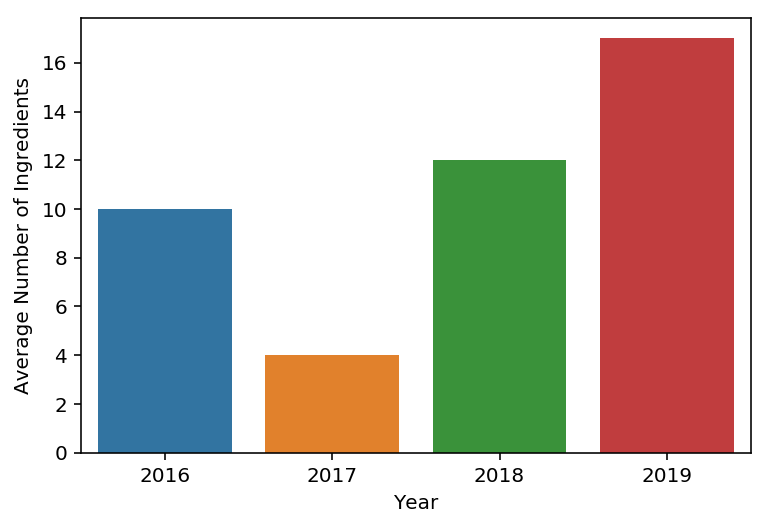

In [0]:
sns.barplot(data = df_year_spl_new, x = 'year', y = 'spl_product_data_elements')
plt.ylabel('Average Number of Ingredients')
plt.xlabel('Year')

Text(0.5, 0, 'Year')

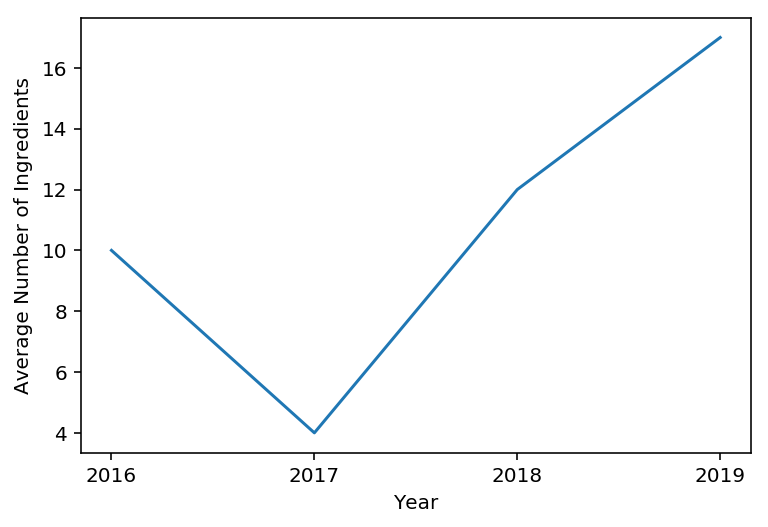

In [0]:
# a lineplot shows the trend over the years (time series) more clearly 

import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
ax = plt.figure().gca()

ax.xaxis.set_major_locator(MaxNLocator(integer=True))

sns.lineplot(data = df_year_spl_new, x = 'year', y = 'spl_product_data_elements')
plt.ylabel('Average Number of Ingredients')
plt.xlabel('Year')



# Part B - Working

Repeat the same analysis, calculate the average number of ingredients per year and per delivery route for all manufacturers.

The output should look similar to:

In [0]:
# year   route      avg_number_of_ingredients
# 2018   oral       123
# 2018   injection  213
# 2017   ...        ...
# ...

The drug 'route' information can be found within the 'openfda' dictionary of the retrived data 

In [0]:
# Inspecting the first element in the 'openfda' dictionary, which is currently a column in df_results

df_results['openfda'][0]

{'application_number': ['NDA020498'],
 'brand_name': ['CASODEX'],
 'generic_name': ['BICALUTAMIDE'],
 'is_original_packager': [True],
 'manufacturer_name': ['AstraZeneca Pharmaceuticals LP'],
 'package_ndc': ['0310-0705-39', '0310-0705-30', '0310-0705-10'],
 'product_ndc': ['0310-0705'],
 'product_type': ['HUMAN PRESCRIPTION DRUG'],
 'route': ['ORAL'],
 'rxcui': ['199123', '108828'],
 'spl_id': ['dbfb2d98-13ad-4815-83d6-b0e10e184881'],
 'spl_set_id': ['03607c0d-b772-435f-c985-ecce8ea8cafd'],
 'substance_name': ['BICALUTAMIDE'],
 'unii': ['A0Z3NAU9DP']}

In [0]:
# flatten the openfda dictionary column to a pandas dataframe with each key as a column name, to make life easier

from pandas.io.json import json_normalize

df_results_openfda = json_normalize(df_results['openfda'])

In [0]:
# the 'route' column indicates the route of administration

df_results_openfda

,application_number,brand_name,generic_name,is_original_packager,manufacturer_name,package_ndc,product_ndc,product_type,route,rxcui,spl_id,spl_set_id,substance_name,unii,upc
0,[NDA020498],[CASODEX],[BICALUTAMIDE],[True],[AstraZeneca Pharmaceuticals LP],"[0310-0705-39, 0310-0705-30, 0310-0705-10]",[0310-0705],[HUMAN PRESCRIPTION DRUG],[ORAL],"[199123, 108828]",[dbfb2d98-13ad-4815-83d6-b0e10e184881],[03607c0d-b772-435f-c985-ecce8ea8cafd],[BICALUTAMIDE],[A0Z3NAU9DP],NaN
1,[NDA020639],[SEROQUEL],[QUETIAPINE FUMARATE],[True],[AstraZeneca Pharmaceuticals LP],"[0310-0275-39, 0310-0274-60, 0310-0278-34, 031...","[0310-0275, 0310-0274, 0310-0272, 0310-0271, 0...",[HUMAN PRESCRIPTION DRUG],[ORAL],"[317174, 616489, 284509, 616485, 616483, 61648...",[0ea67c30-9548-480f-99de-7678dc88a648],[0584dda8-bc3c-48fe-1a90-79608f78e8a0],[QUETIAPINE FUMARATE],[2S3PL1B6UJ],NaN
2,[NDA209210],[BYDUREON BCise],[EXENATIDE],[True],[AstraZeneca Pharmaceuticals LP],"[0310-6540-85, 0310-6540-04, 0310-6540-01]",[0310-6540],[HUMAN PRESCRIPTION DRUG],[SUBCUTANEOUS],"[1990866, 1990869]",[6c84817c-b737-4d93-bedf-9777c0c310a8],[2d18cfc4-e0de-4814-a712-c1b7c504bff5],[EXENATIDE],[9P1872D4OL],NaN
3,[NDA020929],[PULMICORT RESPULES],[BUDESONIDE],[True],[AstraZeneca Pharmaceuticals LP],"[0186-1990-04, 0186-1988-04, 0186-1989-04]","[0186-1989, 0186-1988, 0186-1990]",[HUMAN PRESCRIPTION DRUG],[RESPIRATORY (INHALATION)],"[349094, 351109, 616830, 252559, 616819, 616817]",[31c20a55-52f0-4788-9024-6576d475ab54],[33cd9834-76df-4f26-3fa2-aab6b9eee8f2],[BUDESONIDE],[Q3OKS62Q6X],NaN
4,[NDA209091],[QTERN],[DAPAGLIFLOZIN AND SAXAGLIPTIN],[True],[AstraZeneca Pharmaceuticals LP],"[0310-6770-95, 0310-6770-30, 0310-6780-30, 031...","[0310-6770, 0310-6780]",[HUMAN PRESCRIPTION DRUG],[ORAL],"[2169274, 2169276, 1925498, 1925504]",[95feb35d-4b78-4a9d-9ad4-b3fd60b796fc],[423c489c-085b-4320-b892-7868ebd6dc6b],"[SAXAGLIPTIN HYDROCHLORIDE, DAPAGLIFLOZIN]","[Z8J84YIX6L, 1ULL0QJ8UC]",[0303106770304]
5,[NDA022047],[SEROQUEL XR],[QUETIAPINE FUMARATE],[True],[AstraZeneca Pharmaceuticals LP],"[0310-0282-60, 0310-0281-39, 0310-0297-92, 031...","[0310-0284, 0310-0282, 0310-0283, 0310-0280, 0...",[HUMAN PRESCRIPTION DRUG],[ORAL],"[895671, 895670, 1648646, 853201, 853202, 1648...",[43f06070-52dc-4323-9867-833ff2800652],[473a3ac4-67f4-4782-baa9-7f9bdd8761f4],[QUETIAPINE FUMARATE],[2S3PL1B6UJ],NaN
6,[NDA021093],[ATACAND HCT],[CANDESARTAN CILEXETIL AND HYDROCHLOROTHIAZIDE],[True],[AstraZeneca Pharmaceuticals LP],"[0186-0162-28, 0186-0162-54, 0186-0322-54, 018...","[0186-0324, 0186-0322, 0186-0162]",[HUMAN PRESCRIPTION DRUG],[ORAL],"[802749, 805863, 578330, 578325, 805859, 805855]",[9e314974-b835-461b-b4f4-9f3660ea83ae],[48b021e4-5897-42fd-12be-3190a9b087e8],"[HYDROCHLOROTHIAZIDE, CANDESARTAN CILEXETIL]","[R85M2X0D68, 0J48LPH2TH]",NaN
7,[NDA019962],[TOPROL XL],[METOPROLOL SUCCINATE],[True],[AstraZeneca Pharmaceuticals LP],"[0186-1088-30, 0186-1092-05, 0186-1088-35, 018...","[0186-1090, 0186-1088, 0186-1092, 0186-1094]",[HUMAN PRESCRIPTION DRUG],[ORAL],"[866414, 866412, 866421, 866436, 866438, 86642...",[03b2ba2e-c4b7-449d-8e07-9c0e08171f66],[4a5762c6-d7a2-4e4c-10b7-8832b36fa5f4],[METOPROLOL SUCCINATE],[TH25PD4CCB],NaN
8,[NDA021332],[SymlinPen],[PRAMLINTIDE ACETATE],[True],[AstraZeneca Pharmaceuticals LP],"[0310-6627-02, 0310-6615-02]","[0310-6627, 0310-6615]",[HUMAN PRESCRIPTION DRUG],[SUBCUTANEOUS],"[861043, 861042, 861045, 861044]",[15ee192e-97e1-4867-9b0d-b093b841e939],[4aea30ff-eb0d-45c1-b114-3127966328ff],[PRAMLINTIDE ACETATE],[726I6TE06G],NaN
9,[NDA022405],[CAPRELSA],[VANDETANIB],[True],[AstraZeneca Pharmaceuticals LP],"[0310-7840-30, 0310-7820-30]","[0310-7840, 0310-7820]",[HUMAN PRESCRIPTION DRUG],[ORAL],"[1098418, 1114074, 1098416, 1114096]",[e7eebdc7-a867-4d35-9b5b-2c1829a4e778],[4dc7f0af-77fb-4eec-46b9-dd1c2dcb4525],[VANDETANIB],[YO460OQ37K],NaN


In [0]:
# Join the 'route' column df_results_openfda with the df_year_spl dataframe. 
# No need to align them on an identifier column value, they're in the same order to begin with

df_year_spl['route'] =  df_results_openfda['route']
df_year_spl.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,effective_time,spl_product_data_elements,drug,year,route
0,20171101,CASODEX Bicalutamide BICALUTAMIDE BICALUTAMIDE...,CASODEX,2017,[ORAL]
1,20181129,SEROQUEL Quetiapine fumarate QUETIAPINE FUMARA...,SEROQUEL,2018,[ORAL]
2,20190725,BYDUREON BCise exenatide EXENATIDE EXENATIDE P...,BYDUREON,2019,[SUBCUTANEOUS]
3,20161108,PULMICORT RESPULES Budesonide BUDESONIDE BUDES...,PULMICORT,2016,[RESPIRATORY (INHALATION)]
4,20190613,QTERN dapagliflozin and saxagliptin DAPAGLIFLO...,QTERN,2019,[ORAL]


# Part B - Answer

Again, I haven't got to the answer but this is how I might present the results visually

In [0]:
aggregation_functions = {'route' : 'first', 'drug': 'sum', 'spl_product_data_elements' : 'count', 'year' : 'first',}

df_year_spl_new = df_year_spl.groupby(df_year_spl['year']).aggregate(aggregation_functions)

In [0]:
df_year_spl_new

,route,drug,spl_product_data_elements,year
year,,,,
2016,[RESPIRATORY (INHALATION)],PULMICORTATACANDTOPROLXLSymlinPenCAPRELSAZOLAD...,10,2016
2017,[ORAL],CASODEXQuetiapineFASENRACALQUENCE,4,2017
2018,[ORAL],SEROQUELSEROQUELXRByettaLynparzaTAGRISSOLOKELM...,12,2018
2019,[SUBCUTANEOUS],BYDUREONQTERNBYDUREONFARXIGALynparzaIRESSAFASL...,17,2019


In [0]:
df_year_spl_new['route'] = df_year_spl_new['route'].str[0]

In [0]:
df_year_spl_new['spl_product_data_elements'].sum()

43

Text(0.5, 0, 'Route')

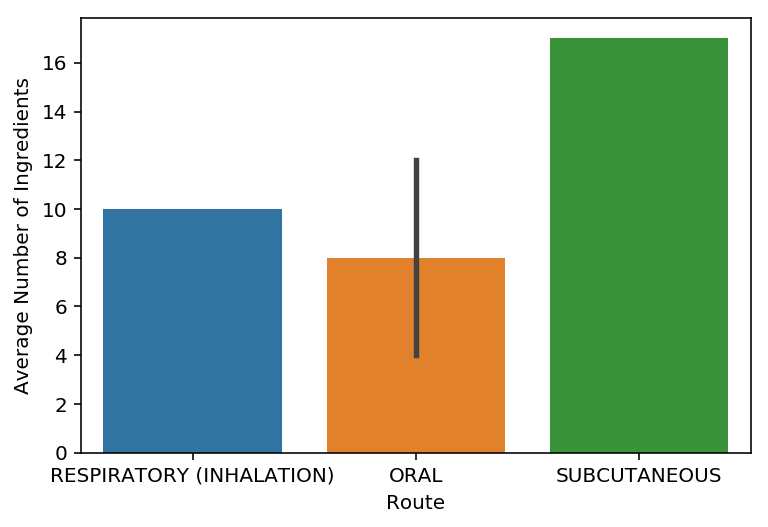

In [0]:
sns.barplot(data = df_year_spl_new, x = 'route', y = 'spl_product_data_elements')
plt.ylabel('Average Number of Ingredients')
plt.xlabel('Route')

# Optional 1.
### How would you code a model to predict the number of ingredients for next year? 
#### Note: Your predictions don't have to be good !

One approach would be to create a time series forecasting model to extrapolate from the current trend 
of average ingredient number per drug each year, in the simplest case by calculating a moving average but perhaps by AutoRegressive Integrated Moving Average (ARIMA) or other time series regression method 
(linear regression model for time series, recurrent neural network such as an long short term memory (LSTM) network), given sufficient training data

The input for training these models would be the available time series (x = year, y = average number of ingredients).
Time series models can be implemented using various Python libraries. 

It would be best to compare the performance of a panel of models in the real-world to determine the best one for job and/or short of that do time series cross validation during training and testing.

In [0]:
series = df_year_spl_new['spl_product_data_elements']

In [0]:
# found an excellent notebook on time series analysis in Python found here: https://nbviewer.jupyter.org/github/Yorko/mlcourse_open/blob/master/jupyter_english/topic09_time_series/topic9_part1_time_series_python.ipynb?flush_cache=true
# this function calculates and plots a moving average and the data used to generate it on lineplot

def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 

    """
    rolling_mean = series.rolling(window=window).mean()
    

    
    plt.figure(figsize=(15,5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series<lower_bond] = series[series<lower_bond]
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)

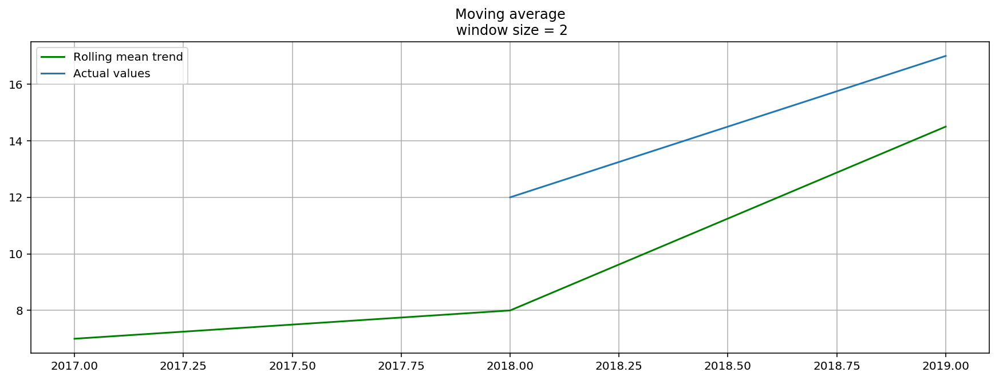

In [0]:
plotMovingAverage(series, 2) 

The moving average might give you a rough idea of the likely average number of ingredients next year, if the average does not vary widely over the averaging window. However, a slightly more sophisticated time series model, incorporating the moving average but including other parameters in the model, such as an ARIMA could also be used. Obviously there's not much data to work with here

In [0]:
from statsmodels.tsa.arima_model import ARIMA

In [0]:
# this is some example code on how you could train, test and view and ARIMA regression model for a time series

series = df_year_spl_new['spl_product_data_elements']

X = series.values
size = int(len(X) * 0.66)

train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)
# plot
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

ValueError: ignored

Or a linear regression model, which might be easier to deploy as it requires no tuning of degrees of freedom

In [0]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import TimeSeriesSplit # you have everything done for you

# Importing everything from above

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)
        
    return np.mean(np.array(errors))
# for time-series cross-validation set 5 folds 


In [0]:
X = df_year_spl_new['spl_product_data_elements']
y = df_year_spl_new['year']

def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [0]:
# y = data.dropna().y
# X = data.dropna().drop(['y'], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [0]:
lr = LinearRegression()
lr.fit(X_train, y_train)

However, there isn't enough data to train any model for that purpose

# Optional 2.
### Could you find the most common drug interactions for AstraZeneca medicines?

The 'drug_interactions' and 'drug_interactions_table' keys in the dataset hold the drug interactions data. 
The 'drug_interactions' data consistents of reports of interactions in written report form (natural language). For example:

"Clinical studies have not shown any drug interactions between bicalutamide and LHRH analogs (goserelin or leuprolide). 
There is no evidence that bicalutamide induces hepatic enzymes. In vitro studies have shown that R-bicalutamide is
an inhibitor of CYP 3A4 with lesser inhibitory effects on CYP 2C9, 2C19 and 2D6 activity."

To find the most common interactions would require a natural language processing (NLP) model
to identify not only keywords in this data but also their meaning in the context of the sentences in which they occur, which describe the complex drug interactions. This is a complicated NLP task requiring a contextual sequence model to 
extract a drug interaction network from this natural language data.

The principle of this approach is summarised in the images below, taken from https://research.zalando.com/welcome/mission/research-projects/flair-nlp/.

Using this sort of approach it may be possible to construct a network/graph data structure, describing all the relevant drug interactions and thereby identify the most common ones for AstraZeneca medicines.

![alt text](https://s3-eu-central-1.amazonaws.com/zalando-wp-zalando-research-production/2018/09/image2.png)

![alt text](https://s3-eu-central-1.amazonaws.com/zalando-wp-zalando-research-production/2018/09/image1.png)

# Optional 3.
### How would you deploy your analysis/model as a tool that other users can use?

Create a dashboard (using Dash, Bokeh or similar) allowing you to generate and visualise your own desired stats 
(per year, per route, per drug) from queries of the openFDA database made through their API as done here,
perhaps along similar lines to that provided on the openFDA website: 
https://open.fda.gov/apis/drug/label/explore-the-api-with-an-interactive-chart/